<a href="https://colab.research.google.com/github/AlenaResiko/Project_curvature/blob/main/Estimate_curvature_2_vOct25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up

In [2]:
import curvature
import manifold
import numpy as np
import matplotlib.pyplot as plt
import math
import networkx as nx

In [3]:
from google.colab import drive
drive.mount('/content/drive')

# distance matrices are loaded from drive

Mounted at /content/drive


# Any manifold function

In [4]:
def sample_any_manifold(manifold_type, n_points, R, file_name, r=0):
  # Euclidean, sphere, Poincare disk, hyperboloid, torus
  if manifold_type == "Euclidean":
    X_Euclidean = manifold.Euclidean.sample(n_points, 3, R=R)
    np.save(file_name, X_Euclidean)
    return X_Euclidean
  if manifold_type == "Sphere":
    X_Sphere = manifold.Sphere.sample(n_points, 3, R=R)
    np.save(file_name, X_Sphere)
    return X_Sphere
  if manifold_type == "PoincareDisk":
    X_PoincareDisk = manifold.PoincareDisk.sample(n_points, Rh = R)
    np.save(file_name, X_PoincareDisk)
    return X_PoincareDisk
  if manifold_type == "Hyperboloid":
    X_Hyperboloid = manifold.Hyperboloid.sample(n_points)
    np.save(file_name, X_Hyperboloid)
    return X_Hyperboloid
  if manifold_type == "Torus":
    X_Torus = manifold.Torus.sample(n_points, r=r, R=R)[0]
    np.save(file_name, X_Torus)
    return X_Torus


In [5]:
def display_any_manifold(manifold_type, X):
  %matplotlib inline
  fig = plt.figure()
  if manifold_type == "Euclidean":
    ax = plt.axes(projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], s = 3)
  if manifold_type == "Sphere":
    ax = plt.axes(projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], s = 3)
  if manifold_type == "PoincareDisk":
    ax = plt.axes(projection='3d')
    ax.scatter(X[:, 0], X[:, 1], s = 3)
  if manifold_type == "Hyperboloid":
    ax = plt.axes(projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], s = 3)
  if manifold_type == "Torus":
    ax = plt.axes(projection='3d')
    ax.scatter(X[:, 0], X[:, 1], X[:, 2], s = 3)
  plt.show()

In [ ]:
# this genrates RGG where edges are not weighted
# def RGG_any_manifold(manifold_type, D, min_distance, X, n_points):
#   G = nx.Graph()
#   e = []
#   position_list = []
#   for i in range(X.shape[0]):
#     position_list.append((i, {"point_position": X[i]}))
#   G.add_nodes_from(position_list)
#   for i in range(n_points):
#     for j in range(i, n_points):
#       if D[i][j] <= epsilon and i<j:
#         e.append([i, j])
#   G.add_edges_from(e)
#   return G

In [6]:
def RGG_any_manifold(manifold_type, D, epsilon, X, n_points):
  G = nx.Graph()
  e = []
  e_weights = []
  e_weighted = []
  position_list = []
  for i in range(X.shape[0]):
    position_list.append((i, {"point_position": X[i]}))
  G.add_nodes_from(position_list)
  for i in range(n_points):
    for j in range(i, n_points):
      if D[i][j] <= epsilon and i<j:
        #e.append([i, j])
        #e_weights.append(D[i,j])
        e_weighted.append((i, j, D[i][j]))
  G.add_weighted_edges_from(e_weighted)
  return G

In [7]:
def calculate_D_any_manifold(manifold_type, X):
  if manifold_type == "Euclidean":
    D = manifold.Euclidean.distance_array(X)
  if manifold_type == "Sphere":
    D = manifold.Sphere.Rdist_array(3, X)
  if manifold_type == "PoincareDisk":
    D = manifold.PoincareDisk.Rdist_array(X)
  if manifold_type == "Hyperboloid":
    D = manifold.Hyperboloid.distance_array(X) # uses Euclidean distance
  if manifold_type == "Torus":
    D = manifold.Torus.distance_array(X) # uses Euclidean distance
  return D

In [ ]:
# def display_graph_any_manifold(manifold_type, G):
#   # nx.draw_networkx_edges(G, pos=nx.get_node_attributes(G, "point_position"))

#   pos = nx.get_node_attributes(G, "point_position")
#   node_xyz = G.nodes()
#   edge_xyz = G.edges()

#   # Create the 3D figure
#   fig = plt.figure()
#   ax = fig.add_subplot(111, projection="3d")

#   # Plot the nodes - alpha is scaled by "depth" automatically
#   ax.scatter(pos, s=100, ec="w")

#   # Plot the edges
#   for vizedge in edge_xyz:
#       ax.plot(*vizedge.T, color="tab:gray")

#   _format_axes(ax)
#   fig.tight_layout()
#   plt.show()

# Example

In [8]:
# hyperparameters
R = 2
r = 1
epsilon = 0.3
n_points = 10000

In [ ]:
# # Sample graph for Euclidean
# %matplotlib notebook
# X_E = sample_any_manifold(manifold_type="Euclidean", n_points=n_points, R=R, file_name="E.npy")
# display_any_manifold(manifold_type = "Euclidean", X = X_E)
# D_Euclidean = calculate_D_any_manifold(manifold_type="Euclidean", X=X_E)
# np.save("D_E.npy", D_Euclidean)
# G_E = RGG_any_manifold("Euclidean", D_Euclidean, epsilon, X=X_E, n_points=n_points)
# pickle.dump(G_E, open('G_E.pickle', 'wb'))

In [13]:
import pickle

X loaded


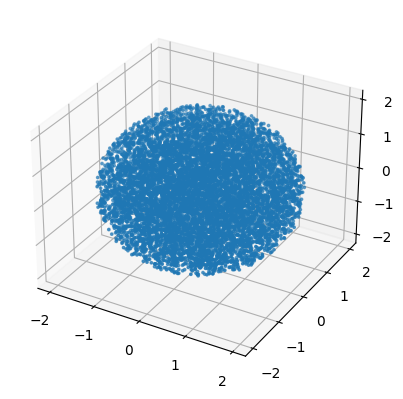

D loaded
G loaded
Number of edges:  154361
[[0.         1.57061836 2.78183075 ... 1.10704496 1.98879709 1.56804507]
 [1.57061836 0.         2.4782316  ... 2.40174262 2.70507006 1.87367931]
 [2.78183075 2.4782316  0.         ... 2.58304909 1.73543008 2.26084612]
 ...
 [1.10704496 2.40174262 2.58304909 ... 0.         1.42488206 1.9747972 ]
 [1.98879709 2.70507006 1.73543008 ... 1.42488206 0.         1.56225101]
 [1.56804507 1.87367931 2.26084612 ... 1.9747972  1.56225101 0.        ]]
[[-0.16277123 -1.48819432  0.30276799]
 [ 0.01287814 -0.69615612 -1.04209812]
 [-0.98700629  1.16817435  0.24869036]
 ...
 [-0.22908175 -1.05664566  1.3200768 ]
 [-1.37181225 -0.21024083  1.23032854]
 [-1.58783954 -0.98148945 -0.11099021]]
Graph with 10000 nodes and 154361 edges


In [18]:
X_E = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/E.npy") #('E.npy')
print("X loaded")
display_any_manifold(manifold_type = "Euclidean", X = X_E)
D_Euclidean = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/D_E.npy") #('D_E.npy')
print("D loaded")
G_E = pickle.load(open("/content/drive/MyDrive/Curvature Project/Calculated arrays/G_E.pickle", 'rb'))
print("G loaded")

print("Number of edges: ", len(G_E.edges()))
print(D_Euclidean)
print(X_E)
print(G_E)

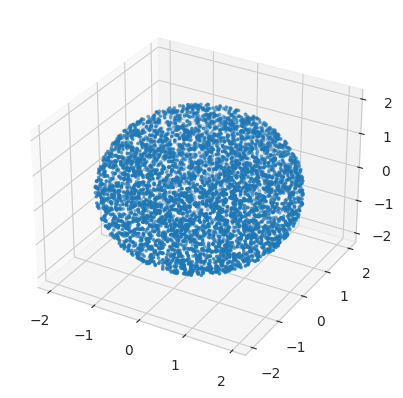

/content/manifold.py:18: RuntimeWarning: invalid value encountered in arccos
  Rdist = np.arccos(dotprod)


In [ ]:
# Sample graph for Sphere
# %matplotlib notebook
# X_S = sample_any_manifold(manifold_type="Sphere", n_points=n_points, R=R, file_name="S.npy")
# display_any_manifold(manifold_type = "Sphere", X = X_S)
# D_Sphere = calculate_D_any_manifold(manifold_type="Sphere", X=X_S)
# np.save("D_S.npy", D_Sphere)
# G_S = RGG_any_manifold("Sphere", D_Sphere, epsilon, X=X_S, n_points=n_points)

X loaded


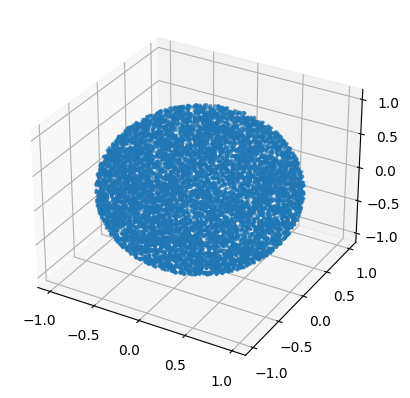

D loaded
G calculated
Number of edges:  281745
[[0.         2.09719351 1.35399061 ... 2.20394962 1.55095934 2.00125804]
 [2.09719351 0.         1.69552336 ... 1.18043803 2.3725607  0.35932893]
 [1.35399061 1.69552336 0.         ... 2.30757199 0.99047284 2.0304863 ]
 ...
 [2.20394962 1.18043803 2.30757199 ... 0.         1.85878706 1.0198471 ]
 [1.55095934 2.3725607  0.99047284 ... 1.85878706 0.         2.65356916]
 [2.00125804 0.35932893 2.0304863  ... 1.0198471  2.65356916 0.        ]]
[[ 0.60956325 -0.08513898  0.7501539   0.24177082]
 [-0.94976415 -0.19532824  0.14362154 -0.19790856]
 [ 0.00320835  0.91994534  0.39189667 -0.01035721]
 ...
 [-0.21847333 -0.54256466 -0.45679003 -0.67025059]
 [ 0.58650241  0.72988617 -0.3227256  -0.13830866]
 [-0.82807726 -0.52703825  0.10767557 -0.15787564]]
Graph with 10000 nodes and 281745 edges


In [ ]:
X_S = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/S.npy")
print("X loaded")
display_any_manifold(manifold_type = "Sphere", X = X_S)
D_Sphere = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/D_S.npy")
print("D loaded")
G_S = RGG_any_manifold("Sphere", D_Sphere, epsilon=epsilon, X=X_S, n_points=n_points)
print("G calculated")

print("Number of edges: ", len(G_S.edges()))
print(D_Sphere)
print(X_S)
print(G_S)

In [ ]:
G_S.edges(data=True)

EdgeDataView([(0, 181, {'weight': 0.0793052702871943}), (0, 362, {'weight': 0.2274461305720824}), (0, 855, {'weight': 0.18493430101768377}), (0, 877, {'weight': 0.24834863318630307}), (0, 975, {'weight': 0.2562148656866998}), (0, 1405, {'weight': 0.29465809319180647}), (0, 1553, {'weight': 0.21261105205521244}), (0, 1642, {'weight': 0.14560746534145794}), (0, 1752, {'weight': 0.2664913149715263}), (0, 1780, {'weight': 0.25228044967165997}), (0, 1933, {'weight': 0.28745237094250414}), (0, 1976, {'weight': 0.2268821777702426}), (0, 1982, {'weight': 0.19658177665729878}), (0, 2146, {'weight': 0.2855011785355865}), (0, 2441, {'weight': 0.18452720833810862}), (0, 2487, {'weight': 0.2761991003905973}), (0, 2530, {'weight': 0.2836339978817333}), (0, 3722, {'weight': 0.18950506274229972}), (0, 3839, {'weight': 0.2711478988128453}), (0, 4017, {'weight': 0.2562371999513926}), (0, 4021, {'weight': 0.23959781946970085}), (0, 4554, {'weight': 0.1554620168243554}), (0, 4691, {'weight': 0.08942794662

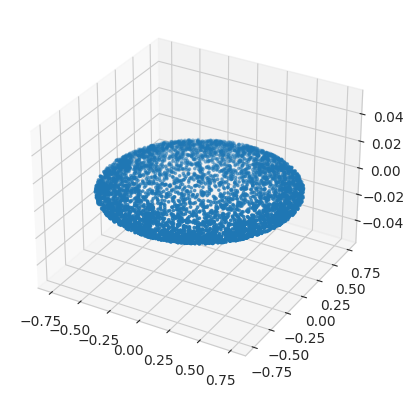

0
1000
2000
3000
4000


In [ ]:
# # Sample graph for PoincareDisk
# %matplotlib notebook
# X_P = sample_any_manifold(manifold_type="PoincareDisk", n_points=n_points, R=R, file_name="P.npy")
# display_any_manifold(manifold_type = "PoincareDisk", X = X_P)
# D_PoincareDisk = calculate_D_any_manifold(manifold_type="PoincareDisk", X=X_P)
# G_P = RGG_any_manifold("PoincareDisk", D_PoincareDisk, epsilon, X=X_P, n_points=n_points)

X loaded


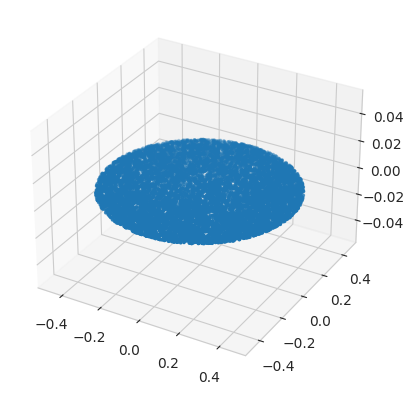

D loaded
G calculated
Number of edges:  3635688
[[0.         1.59740929 1.41281163 ... 1.74369076 0.73445491 0.73668071]
 [1.59740929 0.         0.92169619 ... 0.93984994 1.19945817 1.02260114]
 [1.41281163 0.92169619 0.         ... 1.67224587 0.73220997 0.67620253]
 ...
 [1.74369076 0.93984994 1.67224587 ... 0.         1.6393431  1.44898706]
 [0.73445491 1.19945817 0.73220997 ... 1.6393431  0.         0.19159993]
 [0.73668071 1.02260114 0.67620253 ... 1.44898706 0.19159993 0.        ]]
[[ 0.14264991 -0.4367052 ]
 [-0.05478067  0.28932114]
 [ 0.34632851  0.15899997]
 ...
 [-0.42905436  0.10320844]
 [ 0.29611782 -0.16283683]
 [ 0.21889399 -0.12185994]]
Graph with 10000 nodes and 3635688 edges


In [ ]:
X_P = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/P.npy")
print("X loaded")
display_any_manifold(manifold_type = "PoincareDisk", X = X_P)
D_PoincareDisk = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/D_P.npy")
print("D loaded")
G_P = RGG_any_manifold("PoincareDisk", D_PoincareDisk, epsilon=epsilon, X=X_P, n_points=n_points)
print("G calculated")

print("Number of edges: ", len(G_P.edges()))
print(D_PoincareDisk)
print(X_P)
print(G_P)

True
a =  2
c =  1
B =  2


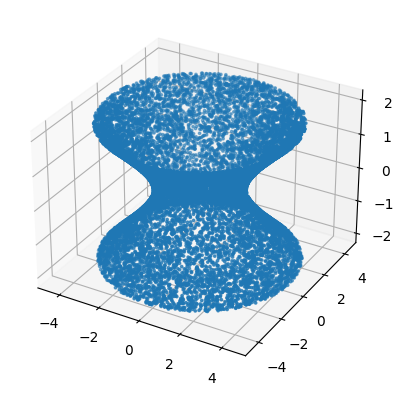

In [ ]:
# Sample graph for Hyperboloid
%matplotlib notebook
X_H = sample_any_manifold(manifold_type="Hyperboloid", n_points=n_points, R=R, file_name="H.npy")
display_any_manifold(manifold_type = "Hyperboloid", X = X_H)
D_Hyperboloid = calculate_D_any_manifold(manifold_type="Hyperboloid", X=X_H)
G_H = RGG_any_manifold("Hyperboloid", D_Hyperboloid, epsilon, X=X_H, n_points=n_points)

In [ ]:
### CANNOT SAMPLE HYPERBOLOID YET - NEED TO CALCULATE D_H ###

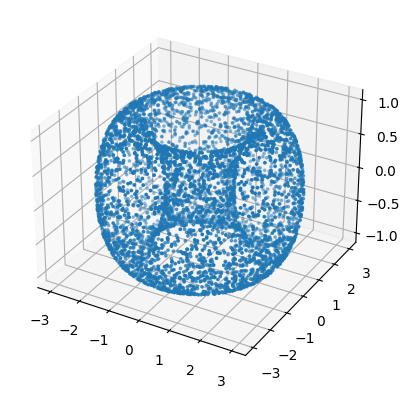

In [ ]:
# # Sample graph for Torus
# %matplotlib notebook
# X_T = sample_any_manifold(manifold_type="Torus", n_points=n_points, r=r, R=R, file_name="T.npy")
# display_any_manifold(manifold_type = "Torus", X = X_T)
# D_Torus = calculate_D_any_manifold(manifold_type="Torus", X=X_T)
# G_T = RGG_any_manifold("Torus", D_Torus, epsilon, X=X_T, n_points=n_points)

X loaded


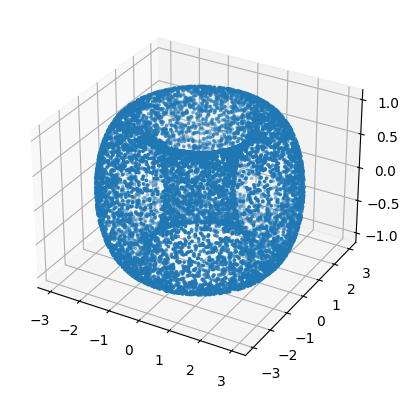

D loaded
G calculated
Number of edges:  179483
[[0.         3.88608979 5.40120165 ... 5.8741956  1.28947112 4.38156024]
 [3.88608979 0.         3.46978605 ... 3.14004102 4.56698884 3.54333708]
 [5.40120165 3.46978605 0.         ... 1.18595575 5.2141547  2.63331601]
 ...
 [5.8741956  3.14004102 1.18595575 ... 0.         5.89601111 2.91552919]
 [1.28947112 4.56698884 5.2141547  ... 5.89601111 0.         4.10215355]
 [4.38156024 3.54333708 2.63331601 ... 2.91552919 4.10215355 0.        ]]
[[-0.09234865  2.98609087  0.1575029 ]
 [ 2.27584799  0.01162938  0.96119275]
 [ 0.48797826 -2.26900292 -0.94711891]
 ...
 [ 1.2142908  -2.73357674 -0.13278955]
 [-1.1814644   2.64483654 -0.44258721]
 [-1.04555622 -1.22199156  0.92006947]]
Graph with 10000 nodes and 179483 edges


In [ ]:
X_T = np.load("/content/drive/MyDrive/Curvature Project/T.npy")
print("X loaded")
display_any_manifold(manifold_type = "Torus", X = X_T)
D_Torus = np.load("/content/drive/MyDrive/Curvature Project/D_T.npy")
print("D loaded")
G_T = RGG_any_manifold("Torus", D_Torus, epsilon=epsilon, X=X_T, n_points=n_points)
print("G calculated")

print("Number of edges: ", len(G_T.edges()))
print(D_Torus)
print(X_T)
print(G_T)

In [ ]:
X_FT = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/FT.npy")
print("X loaded")
display_any_manifold(manifold_type = "FlatTorus", X = X_FT)
D_FlatTorus = np.load("/content/drive/MyDrive/Curvature Project/Calculated arrays/D_FT.npy")
print("D loaded")
G_FT = RGG_any_manifold("FlatTorus", D_FlatTorus, epsilon=epsilon, X=X_FT, n_points=n_points)
print("G calculated")

print("Number of edges: ", len(G_FT.edges()))
print(D_FlatTorus)
print(X_FT)
print(G_FT)

X loaded


<Figure size 640x480 with 0 Axes>

D loaded


**Descr**

X_E = (5000x3) array of coordinates of sampled points

D_Euclidean = (n_points x n_points) array of distances

In [ ]:
import numpy as np
np.array([[i,i+1,i+2] for i in range(2)])

array([[0, 1, 2],
       [1, 2, 3]])

In [ ]:
a = 2
N = 9
x, y = [], []
for i in range(N):
    x += [np.random.random()*a]
    y += [np.random.random()*a]
X = np.array([[[x[i], y[i]] for i in range(N)]])
X

array([[[0.21979937, 1.20741831],
        [1.60041757, 1.59712234],
        [0.11729266, 1.76187864],
        [0.93238834, 1.9373362 ],
        [0.02324273, 0.89787518],
        [0.11694791, 1.45664871],
        [1.23954516, 0.41534962],
        [0.07287713, 0.74749607],
        [0.32835362, 0.1593362 ]]])

In [ ]:
X = X[0]
N = X.shape[0]
D = np.zeros((N, N))
print(D)
hor_vector = [a, 0]
ver_vector = [0, a]
for i in range(N):
  x = X[i, :]
  for j in range(i):
    y = X[j, :]
    d1 = np.linalg.norm(x - y)
    d2 = np.linalg.norm(x - y + hor_vector)
    d3 = np.linalg.norm(x- y - hor_vector)
    d4 = np.linalg.norm(x - y + ver_vector)
    d5 = np.linalg.norm(x- y - ver_vector)
    D[i, j] = min(d1, d2, d3, d4, d5)
    D[j, i] = D[i, j]

[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [ ]:
D

array([[0.        , 0.73178074, 0.56385626, 1.02007999, 0.36667624,
        0.26961865, 1.26026629, 0.48281944, 0.95808752],
       [0.73178074, 0.        , 0.54249839, 0.74967227, 0.81714607,
        0.53529098, 0.89427333, 0.97215371, 1.39076638],
       [0.56385626, 0.54249839, 0.        , 0.83376635, 0.86910723,
        0.30523013, 1.29864352, 0.98661769, 0.45002138],
       [1.02007999, 0.74967227, 0.83376635, 0.        , 1.32256602,
        0.94657465, 0.56819199, 1.18115136, 0.64353862],
       [0.36667624, 0.81714607, 0.86910723, 1.32256602, 0.        ,
        0.56657614, 0.92033297, 0.15835861, 0.79908227],
       [0.26961865, 0.53529098, 0.30523013, 0.94657465, 0.56657614,
        0.        , 1.36166786, 0.71052072, 0.73379976],
       [1.26026629, 0.89427333, 1.29864352, 0.56819199, 0.92033297,
        1.36166786, 0.        , 0.89708608, 0.94647393],
       [0.48281944, 0.97215371, 0.98661769, 1.18115136, 0.15835861,
        0.71052072, 0.89708608, 0.        , 0.64124899],


# In work - display 3d RGG with right position

In [ ]:
#display_graph_any_manifold("Euclidean", G_E)

In [ ]:
#G_E.nodes("point_position")

In [ ]:
#G_E.nodes(data=True)

# Calculate ORC

In [ ]:
!pip install GraphRicciCurvature
!pip install scikit-learn

import importlib
# matplotlib setting
%matplotlib inline

# # to print logs in jupyter notebook
# import logging
# logging.basicConfig(format='%(levelname)s:%(message)s', level=logging.ERROR)

from GraphRicciCurvature.OllivierRicci import OllivierRicci
# load python-louvain for modularity computation
# import community as community_louvain

# for ARI computation
from sklearn import preprocessing, metrics

import GraphRicciCurvature
print(GraphRicciCurvature.__version__)

In [ ]:
def calculate_ORC_any_manifold(G_for_orc):
  orc = OllivierRicci(G_for_orc, alpha=0.5, verbose="TRACE")
  orc.compute_ricci_curvature()
  G_orc = orc.G.copy()
  #show_results
  # Print the first thirty results
  print("G, first 100 edges: ")
  for n1,n2 in list(G_orc.edges())[:100]:
      print("Ollivier-Ricci curvature of edge (%s,%s) is %f" % (n1 ,n2, G_orc[n1][n2]["ricciCurvature"]))

  # Plot the histogram of Ricci curvatures
  plt.subplot(2, 1, 1)
  ricci_curvtures = nx.get_edge_attributes(G_orc, "ricciCurvature").values()
  plt.hist(ricci_curvtures,bins=30)
  plt.xlabel('Ricci curvature')
  plt.title("Histogram of Ricci Curvatures")

  # Plot the histogram of edge weights
  plt.subplot(2, 1, 2)
  weights = nx.get_edge_attributes(G_orc, "weight").values()
  plt.hist(weights,bins=20)
  plt.xlabel('Edge weight')
  plt.title("Histogram of Edge weights")

  plt.tight_layout()

  return G_orc

In [ ]:
def calculate_ORSC_any_manifold(G_orc):

  dict_orsc = {}
  list_nodes = list(G_orc.nodes())
  for n1 in list_nodes:
    n_neighbours = len(list(nx.edges(G_orc, n1))) # number nodes adjacent to n1 (checked)
    sum = 0 # sum of adjacent edges's ORC
    for i in range(n_neighbours):
      n2 = list(nx.edges(G_orc, n1))[i][1] # checked
      sum += G_orc[n1][n2]["ricciCurvature"]

    if n_neighbours != 0:
      dict_orsc[n1] = sum / n_neighbours
    else:
      print("node of 0 degree")
      dict_orsc[n1] = 0

  nx.set_node_attributes(G_orc, dict_orsc, name = "oliverDiscreteRicciCurvature")
  # Print the first 30 results
  print("ORSC, first 30 nodes: ")
  orsc_nodes = nx.get_node_attributes(G_orc, "oliverDiscreteRicciCurvature")
  i = 0
  for n1 in list(G_orc.nodes())[:45]:
    print("Discrete Ollivier-Ricci curvature of node %s is %f" % (n1, orsc_nodes[i]))
    i += 1

  # Plot the histogram of Ricci curvatures
  plt.subplot(2, 1, 1)
  # discrete_ricci_curvtures = nx.get_node_attributes(G_orc, "oliverDiscreteRicciCurvature").values()
  plt.hist(orsc_nodes.values(),bins=25)
  plt.xlabel('ORSC curvature')
  plt.title("Histogram of Scalar Ricci Curvatures")

  plt.tight_layout()

  return G_orc

In [ ]:
###G_E_copy_for_orc = G_E.copy()
E_orc = calculate_ORC_any_manifold(G_E_copy_for_orc)

TRACE:GraphRicciCurvature:Number of nodes: 10000
TRACE:GraphRicciCurvature:Number of edges: 154361
TRACE:GraphRicciCurvature:Start to compute all pair shortest path.


KeyboardInterrupt: ignored

In [ ]:
list(nx.edges(E_orc, 0))[0][1]

284

In [ ]:
E_orsc = calculate_ORSC_any_manifold(E_orc)

In [ ]:
nx.get_node_attributes(E_orc, "oliverDiscreteRicciCurvature")

{0: -0.09984438183312529,
 1: -0.055635558760366396,
 2: 0.0003114579932427068,
 3: -0.038430240136403386,
 4: -0.05443498643855209,
 5: 0.02987156261283339,
 6: 0.04217547516317427,
 7: -0.062198702432793164,
 8: 0.012878580075132177,
 9: 0.004444533432514365,
 10: 0.013461136736495167,
 11: -0.04344264017198082,
 12: 0.030063165481127228,
 13: 0.12399337607639041,
 14: -0.04551838213826933,
 15: 0.022158660703162525,
 16: -0.04482564315492748,
 17: 0.05097358181369291,
 18: 0.13012934498079134,
 19: 0.046994002000140485,
 20: 0.027652342915145945,
 21: 0.09770913855520107,
 22: -0.04478383005854046,
 23: 0.0053619113378960345,
 24: 0.04175068009479847,
 25: -0.0009848312690844603,
 26: -0.08423765261775122,
 27: -0.0603603848326555,
 28: -0.03107894123496641,
 29: -0.04234705839746921,
 30: 0.11032106075680516,
 31: 0.07237517345162502,
 32: -0.06560673181114975,
 33: 0.04362165039946226,
 34: -0.031785548900480694,
 35: -0.062024723503579404,
 36: -0.0015583806323822434,
 37: -0.017

In [ ]:
S_orc = calculate_ORC_any_manifold(G_S)

TRACE:GraphRicciCurvature:Number of nodes: 10000
TRACE:GraphRicciCurvature:Number of edges: 281745
TRACE:GraphRicciCurvature:Start to compute all pair shortest path.


In [ ]:
list(nx.edges(S_orc, 0))

[(0, 181),
 (0, 362),
 (0, 855),
 (0, 877),
 (0, 975),
 (0, 1405),
 (0, 1553),
 (0, 1642),
 (0, 1752),
 (0, 1780),
 (0, 1933),
 (0, 1976),
 (0, 1982),
 (0, 2146),
 (0, 2441),
 (0, 2487),
 (0, 2530),
 (0, 3722),
 (0, 3839),
 (0, 4017),
 (0, 4021),
 (0, 4554),
 (0, 4691),
 (0, 4761),
 (0, 4783),
 (0, 4843),
 (0, 5014),
 (0, 5057),
 (0, 5192),
 (0, 5458),
 (0, 5572),
 (0, 5594),
 (0, 5671),
 (0, 5872),
 (0, 5918),
 (0, 6026),
 (0, 6156),
 (0, 6180),
 (0, 6265),
 (0, 6450),
 (0, 6765),
 (0, 7308),
 (0, 7792),
 (0, 7915),
 (0, 8050),
 (0, 8864),
 (0, 8871),
 (0, 9109),
 (0, 9320),
 (0, 9491),
 (0, 9510),
 (0, 9989)]

ORSC, first 30 nodes: 
Discrete Ollivier-Ricci curvature of node 0 is -0.005978
Discrete Ollivier-Ricci curvature of node 1 is 0.011181
Discrete Ollivier-Ricci curvature of node 2 is 0.015109
Discrete Ollivier-Ricci curvature of node 3 is -0.007776
Discrete Ollivier-Ricci curvature of node 4 is -0.023681
Discrete Ollivier-Ricci curvature of node 5 is -0.003757
Discrete Ollivier-Ricci curvature of node 6 is -0.014754
Discrete Ollivier-Ricci curvature of node 7 is -0.013159
Discrete Ollivier-Ricci curvature of node 8 is -0.036598
Discrete Ollivier-Ricci curvature of node 9 is -0.002792
Discrete Ollivier-Ricci curvature of node 10 is -0.003031
Discrete Ollivier-Ricci curvature of node 11 is 0.010191
Discrete Ollivier-Ricci curvature of node 12 is -0.058950
Discrete Ollivier-Ricci curvature of node 13 is 0.012326
Discrete Ollivier-Ricci curvature of node 14 is 0.031375
Discrete Ollivier-Ricci curvature of node 15 is -0.005200
Discrete Ollivier-Ricci curvature of node 16 is -0.010470
Discre

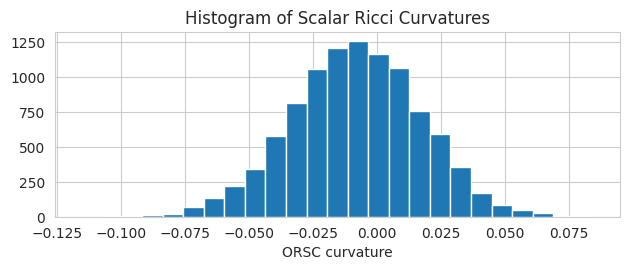

In [ ]:
S_orsc = calculate_ORSC_any_manifold(S_orc)

In [ ]:
nx.get_node_attributes(S_orc, "oliverDiscreteRicciCurvature")

{0: -0.005977552589567354,
 1: 0.011181453802270128,
 2: 0.015108739942104732,
 3: -0.007775910038533798,
 4: -0.023681371243039366,
 5: -0.0037565093958930674,
 6: -0.014754070769603597,
 7: -0.013158932338794492,
 8: -0.03659837776550167,
 9: -0.002791687722195383,
 10: -0.0030312213519302737,
 11: 0.010191089674964637,
 12: -0.05894962126739598,
 13: 0.012326483877637318,
 14: 0.03137462460139074,
 15: -0.0052004050420259625,
 16: -0.010469635112960353,
 17: -0.01748363287414673,
 18: -0.009565130539967241,
 19: -0.04184033583014653,
 20: 0.0097378177275492,
 21: -0.04492035338617098,
 22: 0.01569389410612962,
 23: -0.03714007829697864,
 24: -0.01666051169758736,
 25: -0.034360782028680634,
 26: -0.028896617683939335,
 27: -0.02612469126544405,
 28: 0.0016183707167860696,
 29: 0.044810447166283275,
 30: 0.026909788006732754,
 31: 0.04663096344666247,
 32: -0.01587818276476177,
 33: 0.023377547723110723,
 34: 0.03920518045893955,
 35: -0.0042608532373495656,
 36: -0.01466608514516221

In [ ]:
nx.get_node_attributes(S_orc, "oliverDiscreteRicciCurvature").values()

dict_values([-0.005977552589567354, 0.011181453802270128, 0.015108739942104732, -0.007775910038533798, -0.023681371243039366, -0.0037565093958930674, -0.014754070769603597, -0.013158932338794492, -0.03659837776550167, -0.002791687722195383, -0.0030312213519302737, 0.010191089674964637, -0.05894962126739598, 0.012326483877637318, 0.03137462460139074, -0.0052004050420259625, -0.010469635112960353, -0.01748363287414673, -0.009565130539967241, -0.04184033583014653, 0.0097378177275492, -0.04492035338617098, 0.01569389410612962, -0.03714007829697864, -0.01666051169758736, -0.034360782028680634, -0.028896617683939335, -0.02612469126544405, 0.0016183707167860696, 0.044810447166283275, 0.026909788006732754, 0.04663096344666247, -0.01587818276476177, 0.023377547723110723, 0.03920518045893955, -0.0042608532373495656, -0.014666085145162214, -0.009864325465969036, -0.012366581633981756, 0.014409807475875879, 0.007261066430089629, 0.005526234989182271, 0.0034383024257993037, 0.0485628492244949, -0.0

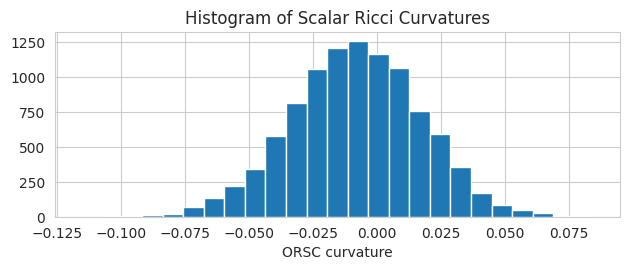

In [ ]:
# Plot the histogram of Ricci curvatures
plt.subplot(2, 1, 1)
orsc_nodes = nx.get_node_attributes(S_orc, "oliverDiscreteRicciCurvature").values()
plt.hist(orsc_nodes,bins=25)
plt.xlabel('ORSC curvature')
plt.title("Histogram of Scalar Ricci Curvatures")

plt.tight_layout()

TRACE:GraphRicciCurvature:Number of nodes: 10000
TRACE:GraphRicciCurvature:Number of edges: 179483
TRACE:GraphRicciCurvature:Start to compute all pair shortest path.
TRACE:GraphRicciCurvature:70.024501 secs for all pair by NetworKit.
INFO:GraphRicciCurvature:104.849758 secs for Ricci curvature computation.


G_E, first 100 edges: 
Ollivier-Ricci curvature of edge (0,821) is 0.133715
Ollivier-Ricci curvature of edge (0,988) is 0.085864
Ollivier-Ricci curvature of edge (0,1261) is -0.017992
Ollivier-Ricci curvature of edge (0,1548) is 0.096473
Ollivier-Ricci curvature of edge (0,1772) is 0.024649
Ollivier-Ricci curvature of edge (0,2083) is 0.149910
Ollivier-Ricci curvature of edge (0,2087) is -0.143947
Ollivier-Ricci curvature of edge (0,2158) is -0.001980
Ollivier-Ricci curvature of edge (0,2162) is -0.075693
Ollivier-Ricci curvature of edge (0,2425) is 0.050927
Ollivier-Ricci curvature of edge (0,3302) is 0.037548
Ollivier-Ricci curvature of edge (0,3830) is -0.161220
Ollivier-Ricci curvature of edge (0,3905) is -0.020142
Ollivier-Ricci curvature of edge (0,4126) is -0.202316
Ollivier-Ricci curvature of edge (0,4192) is 0.017765
Ollivier-Ricci curvature of edge (0,4381) is 0.039005
Ollivier-Ricci curvature of edge (0,4518) is -0.129500
Ollivier-Ricci curvature of edge (0,5235) is -0.19088

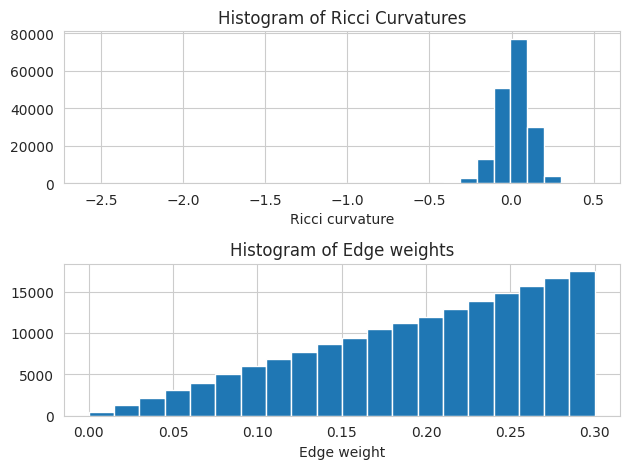

In [ ]:
T_orc = calculate_ORC_any_manifold(G_T)

ORSC, first 30 nodes: 
Discrete Ollivier-Ricci curvature of node 0 is 0.002741
Discrete Ollivier-Ricci curvature of node 1 is 0.026960
Discrete Ollivier-Ricci curvature of node 2 is 0.068432
Discrete Ollivier-Ricci curvature of node 3 is -0.020671
Discrete Ollivier-Ricci curvature of node 4 is 0.013495
Discrete Ollivier-Ricci curvature of node 5 is 0.020635
Discrete Ollivier-Ricci curvature of node 6 is 0.084723
Discrete Ollivier-Ricci curvature of node 7 is 0.017211
Discrete Ollivier-Ricci curvature of node 8 is -0.041730
Discrete Ollivier-Ricci curvature of node 9 is -0.011320
Discrete Ollivier-Ricci curvature of node 10 is -0.006291
Discrete Ollivier-Ricci curvature of node 11 is 0.011978
Discrete Ollivier-Ricci curvature of node 12 is 0.012655
Discrete Ollivier-Ricci curvature of node 13 is 0.054127
Discrete Ollivier-Ricci curvature of node 14 is 0.017513
Discrete Ollivier-Ricci curvature of node 15 is 0.060446
Discrete Ollivier-Ricci curvature of node 16 is -0.045654
Discrete Olli

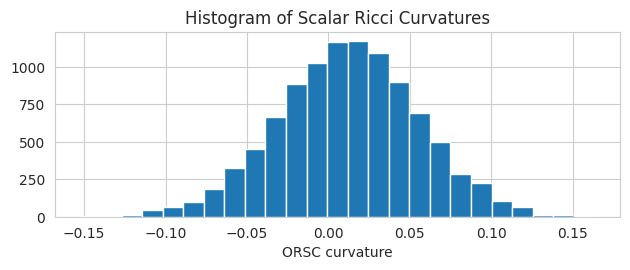

In [ ]:
T_orsc = calculate_ORSC_any_manifold(T_orc)

In [ ]:
P_orc = calculate_ORC_any_manifold(G_P)

TRACE:GraphRicciCurvature:Number of nodes: 10000
TRACE:GraphRicciCurvature:Number of edges: 3635688
TRACE:GraphRicciCurvature:Start to compute all pair shortest path.
TRACE:GraphRicciCurvature:435.817828 secs for all pair by NetworKit.


In [ ]:
P_orsc = calculate_ORSC_any_manifold(P_orc)